In [1]:
# === Core Python ===
import os
import collections
from datetime import datetime
import datetime as dt
import json 
import glob 

# === Numerical and Data Handling ===
import numpy as np
import numpy.ma as ma
import pandas as pd
import xarray as xr
import xcdat as xcd
import xskillscore as xs
from scipy.stats import pearsonr
from scipy.signal import butter, filtfilt, sosfilt, lfilter
from skimage.feature import peak_local_max

# === Plotting ===
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
from matplotlib.patches import Polygon
from matplotlib import ticker
from matplotlib.ticker import MultipleLocator
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.ticker as mticker

# === Mapping and Geospatial ===
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as sticker
from cartopy.mpl.ticker import LongitudeFormatter


In [2]:
class SouthNorthCrossPlotter:
    def __init__(self, case, season, period, ref_key, data_dict, fig_path,
                 model_label_dict, var_dict, clevs_dict, colors_dict, fontsize):
        self.case = case
        self.group = season
        self.period = period
        self.ref_key = ref_key
        self.ens_mean_dict = data_dict
        self.fig_path = fig_path
        self.var_dict = var_dict
        self.clevs_dict = clevs_dict
        self.colors_dict = colors_dict
        self.fontsize = fontsize
        self.model_label_dict = model_label_dict
        self.var_list = list(var_dict.keys())

    @staticmethod
    def generate_coslat_weight(ds):
        weights = np.cos(np.deg2rad(ds.lat))
        _, weights = xr.broadcast(ds, weights)
        return weights

    @staticmethod
    def normalize_longitude(da):
        lon = da['lon']
        if lon.max() > 180:
            lon = ((lon + 180) % 360) - 180
            da = da.assign_coords(lon=lon)
            da = da.sortby('lon')
        return da

    def plot(self):
        df = self.ens_mean_dict
        model_list = list(df.keys())

        nrows, ncols = len(self.var_list), len(model_list)
        fcl = ncols / 4.0
        fgw, fgh = 22 * fcl, 18
        fontz = self.fontsize  
        frac = 1.0 
        
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fgw, fgh),
                                 subplot_kw={'projection': ccrs.PlateCarree()},
                                 constrained_layout=True)
        
        if nrows == 1:
            axes = np.expand_dims(axes, axis=0)
        if ncols == 1:
            axes = np.expand_dims(axes, axis=1)

        for i, var in enumerate(self.var_list):
            vunt = self.var_dict[var]['unit']
            vlabel = self.var_dict[var]['name']
            levels = self.clevs_dict[var]
            color_list = self.colors_dict[var]
            #norm = mcolors.BoundaryNorm(levels, len(levels) - 1)
            norm = mcolors.BoundaryNorm(levels, ncolors=len(color_list), extend='both')
            kwargs = dict(levels=levels, colors=color_list, extend='both', zorder=1)

            plots = []
            for j, model in enumerate(model_list):
                ds_model = df[model]
                da_model = ds_model[var]
                da_model = self.normalize_longitude(da_model)

                ds_ref = df[self.ref_key]
                da_ref = ds_ref[var]  
                da_ref = self.normalize_longitude(da_ref)

                lon = da_model['lon']
                lat = da_model['lat']

                finite_mask = np.isfinite(da_model) & np.isfinite(da_ref)
                weights = self.generate_coslat_weight(finite_mask)
                weights_masked = weights.where(finite_mask)

                da_ref_masked = da_ref.where(finite_mask)
                da_model_masked = da_model.where(finite_mask)

                if model == self.ref_key:
                    metrics_str = ""
                else:
                    rmse = xs.rmse(da_ref_masked, da_model_masked, dim=["lat", "lon"], weights=weights_masked)
                    pcor = xs.pearson_r(da_ref_masked, da_model_masked, dim=["lat", "lon"], weights=weights_masked)
                    metrics_str = f"PCC: {pcor:.2f}"

                ax = axes[i, j]
                contour = ax.contourf(lon, lat, da_model, norm=norm, **kwargs)
                plots.append(contour)
                
                panel_label = f"({chr(97 + i)}{j + 1})"
                model_display_name = self.model_label_dict.get(model, model)

                title_fontsize = fontz * frac * 1.2
                ax.text(0.0, 1.02, f"{panel_label} {model_display_name}", 
                        transform=ax.transAxes, fontsize=title_fontsize,
                        ha='left', va='bottom')
                ax.text(1.0, 1.02, metrics_str,
                        transform=ax.transAxes, fontsize=title_fontsize,
                        ha='right', va='bottom')

                ax.set_xlabel("Longitude", fontsize=fontz * frac)
                ax.set_ylabel("Latitude", fontsize=fontz * frac)
                ax.coastlines(linewidth=0.5)

                gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray', alpha=0.5, linestyle='--')
                gl.top_labels = False
                gl.right_labels = False
                gl.xlabel_style = {'size': fontz * frac * 0.9}
                gl.ylabel_style = {'size': fontz * frac * 0.9}
                gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 60))
                gl.xformatter = LongitudeFormatter(number_format='.0f', degree_symbol="")

            cbar_ax = fig.add_axes([0.1, 0.77 - i * 0.25, 0.8, 0.015])
            cb = fig.colorbar(plots[0], cax=cbar_ax, orientation='horizontal', format="{x:.2f}", norm=norm, drawedges=True)
            cb.set_ticks(levels)
            cb.set_ticklabels([f"{tick:.1e}" for tick in levels])
            cb.ax.tick_params(labelsize=fontz * frac * 0.9)
            cb.set_label(f'{vlabel} ({vunt})', fontsize=fontz * frac * 0.9)
            cb.outline.set_edgecolor('black')
            cb.outline.set_linewidth(0.2)
            cb.solids.set_edgecolor("black")
            cb.solids.set_linewidth(0.1)

        os.makedirs(self.fig_path, exist_ok=True)
        fname = os.path.join(self.fig_path, f'fig_nudge_tend_{self.case}_{self.group}.pdf')
        fig.savefig(fname, dpi=600, bbox_inches='tight')
        print(f"Figure saved to: {fname}")
        plt.show()
        plt.close(fig)


Processing season: ANN
Figure saved to: ./fig_nudge_tend_online_ML_IMT_cut100_ANN.pdf


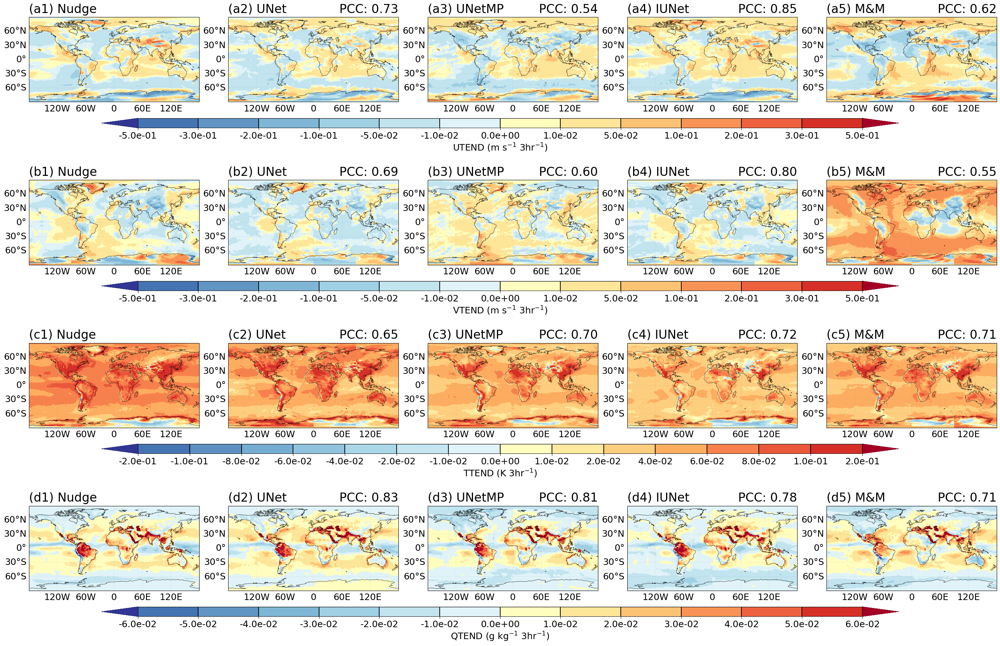

Processing season: DJF
Figure saved to: ./fig_nudge_tend_online_ML_IMT_cut100_DJF.pdf


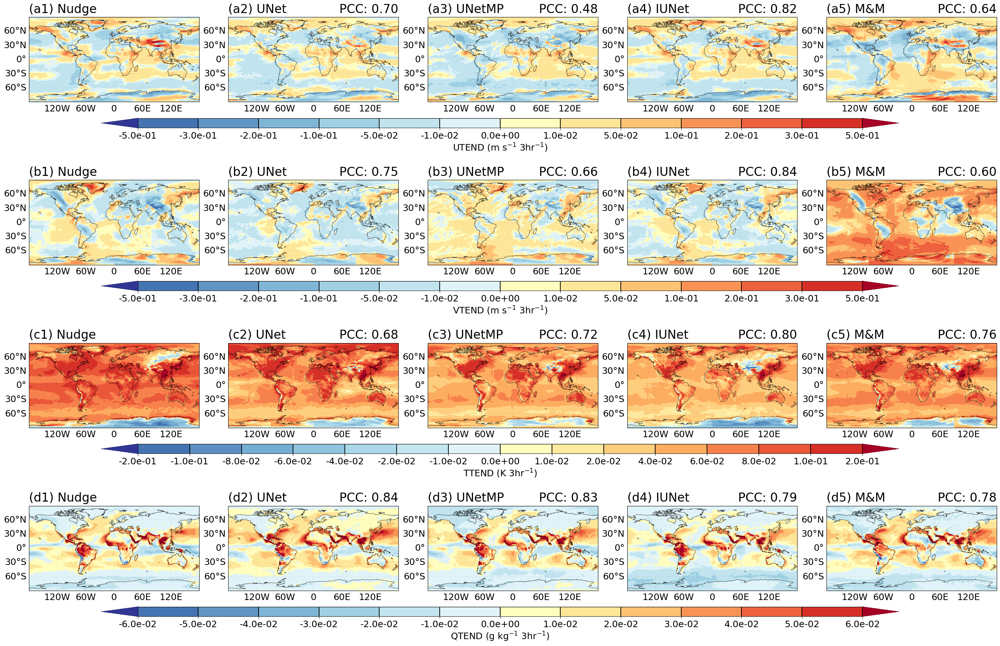

Processing season: JJA
Figure saved to: ./fig_nudge_tend_online_ML_IMT_cut100_JJA.pdf


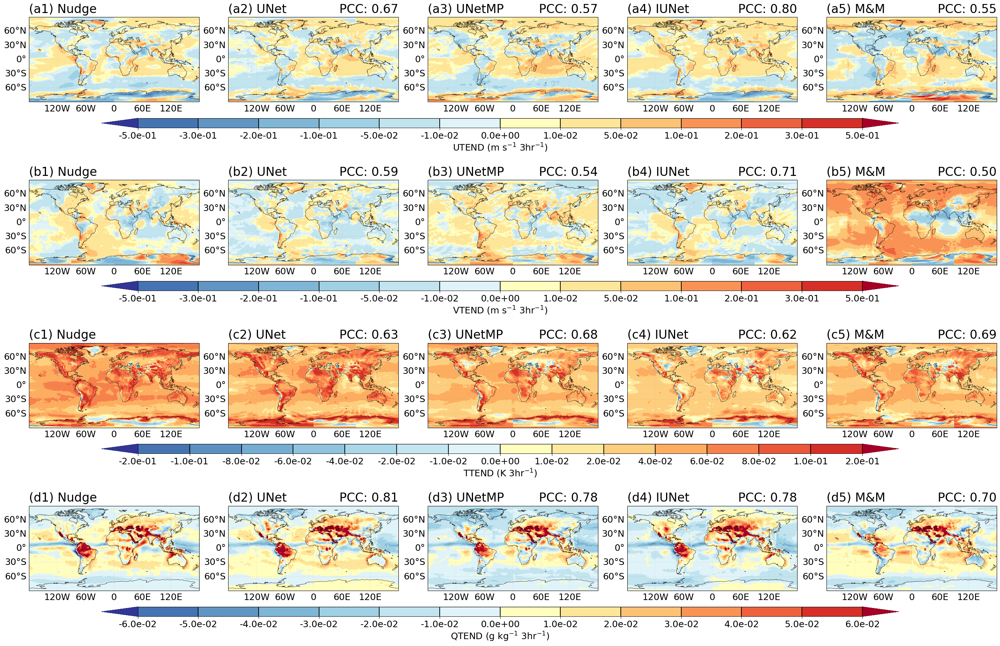

Processing season: SON
Figure saved to: ./fig_nudge_tend_online_ML_IMT_cut100_SON.pdf


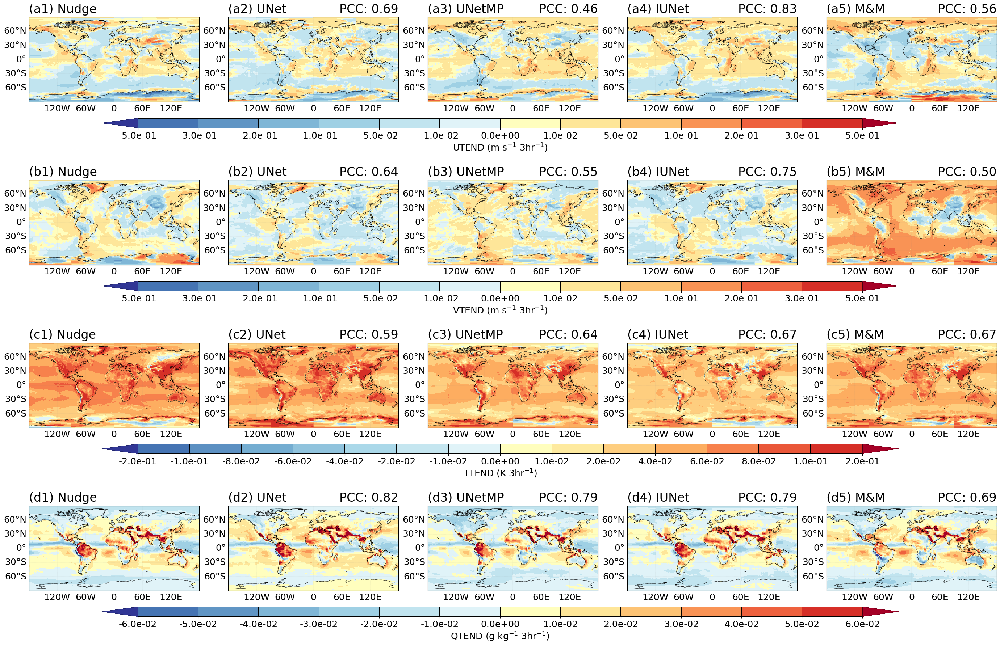

Processing season: MAM
Figure saved to: ./fig_nudge_tend_online_ML_IMT_cut100_MAM.pdf


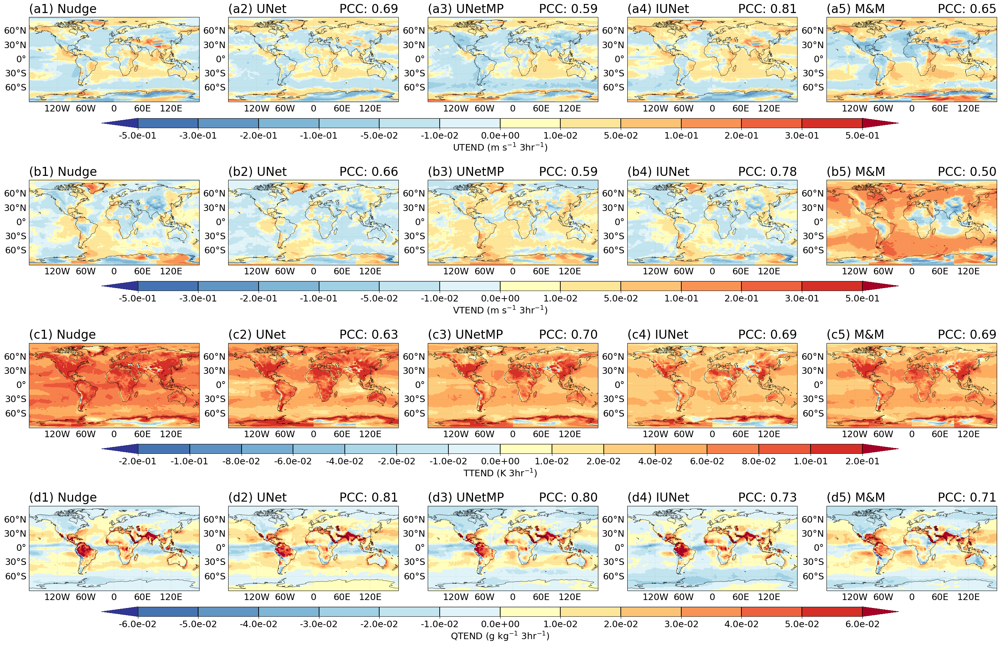

In [3]:
if __name__ == "__main__":
    # === Define Paths ===
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    work_path = f"{top_path}/paper_material/method_paper"
    out_path  = f"{work_path}/fig_data"
    fig_path  = f"./"
    os.makedirs(fig_path, exist_ok=True)

    # === Time Info and Reference ===
    period  = "201201_201612"
    ttag    = "5yr"
    seasons = ["ANN", "DJF", "JJA", "SON", "MAM"]

    # === Variable settings ===
    var_dict = {
        "Nudge_U": {
            'name': "UTEND",
            'unit': 'm s$^{-1}$ 3hr$^{-1}$',
            'clevs': [-0.5,-0.3,-0.2,-0.1,-0.05,-0.01,0,0.01,0.05,0.1,0.2,0.3,0.5],
        },
        "Nudge_V": {
            'name': "VTEND",
            'unit': 'm s$^{-1}$ 3hr$^{-1}$',
            'clevs': [-0.5,-0.3,-0.2,-0.1,-0.05,-0.01,0,0.01,0.05,0.1,0.2,0.3,0.5],
        },
        "Nudge_T": {
            'name': "TTEND",
            'unit': 'K 3hr$^{-1}$',
            'clevs': [-0.2,-0.1,-0.08,-0.06,-0.04,-0.02,-0.01,0,0.01,0.02,0.04,0.06,0.08,0.1,0.2],
        },
        "Nudge_Q": {
            'name': "QTEND",
            'unit': 'g kg$^{-1}$ 3hr$^{-1}$',
            'clevs': [-0.06,-0.05,-0.04,-0.03,-0.02,-0.01,0,0.01,0.02,0.03,0.04,0.05,0.06],
        }
    }
    
    fontsize = 20 
    
    # === Construct clevs and colors ===
    clevs_dict = {}
    colors_dict = {}
    index = np.linspace(0.05, 0.95, 20)  # Adjust levels as needed
    newcmp = cm.RdYlBu_r  # Red-Yellow-Blue reversed

    for var in var_dict.keys():
        levels = np.array(var_dict[var]['clevs'])  # e.g., 13 levels
        clevs_dict[var] = levels
        n_intervals = len(levels) - 1
    
        # Find the index where zero is located
        zero_idx = np.where(levels == 0)[0][0]
    
        # Split intervals: negative, zero, positive
        n_neg = zero_idx
        n_pos = n_intervals - n_neg
    
        # Sample cool colors for negative, warm colors for positive
        warm_colors = [newcmp(k) for k in np.linspace(0.5,0.9, n_neg)]  # blue shades
        cool_colors = [newcmp(k) for k in np.linspace(0.1,0.4, n_pos)]  # red shades
    
        full_colors = cool_colors + warm_colors  # Concatenate
        cmap = mcolors.ListedColormap(full_colors)
        extended_colors = [newcmp(0.0)] + full_colors + [newcmp(1.0)]
        colors_dict[var] = extended_colors

    # === Load experiment dictionary ===
    json_file = f"{work_path}/experiment_info/e3sm_experiments.json"
    with open(json_file, "r") as f:
        exp_dict = json.load(f)

    # === Define experiment group ===
    ref_key = "NDGUVTQ"
    group = "online_ML_IMT_cut100"
    model_list = {
        "NDGUVTQ":              "Nudge",
        "UNET_IMT_cut100":      "UNet",
        "UNETMP_IMT_cut100":    "UNetMP",
        "IUNET_IMT_cut100":     "IUNet",
        "MnM_IMT_cut100":       "M&M"
    }

    for season in seasons:
        print(f"Processing season: {season}")
        
        # === Load data for each season ===
        data_dict = {}
        for model in model_list:
            file_path = f"{out_path}/{ttag}/{model}_nudge_tend_{season}.nc"
            data_dict[model] = xr.open_dataset(file_path)

        # === Create plotter with all necessary attributes ===
        plotter = SouthNorthCrossPlotter(
            case=group,
            season=season,
            period=period,
            ref_key=ref_key,
            data_dict=data_dict,
            fig_path=fig_path,
            model_label_dict = model_list, 
            var_dict=var_dict,
            clevs_dict=clevs_dict,
            colors_dict=colors_dict,
            fontsize=fontsize
        )
        
        plotter.plot()
